1 .
Wykryte oczka: 14
Poprawna wartość: 14


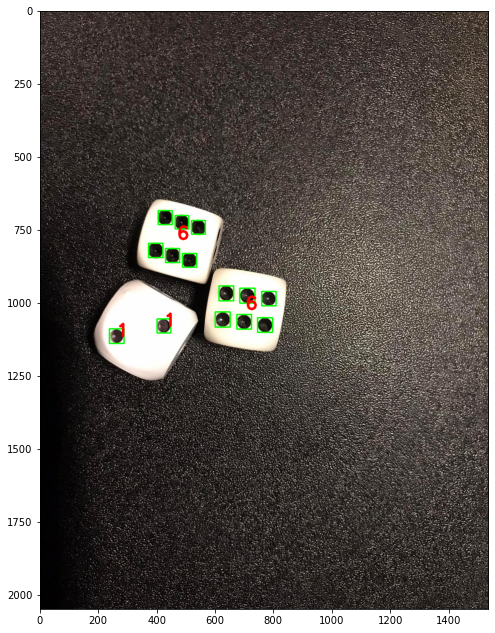

2 .
Wykryte oczka: 6
Poprawna wartość: 6


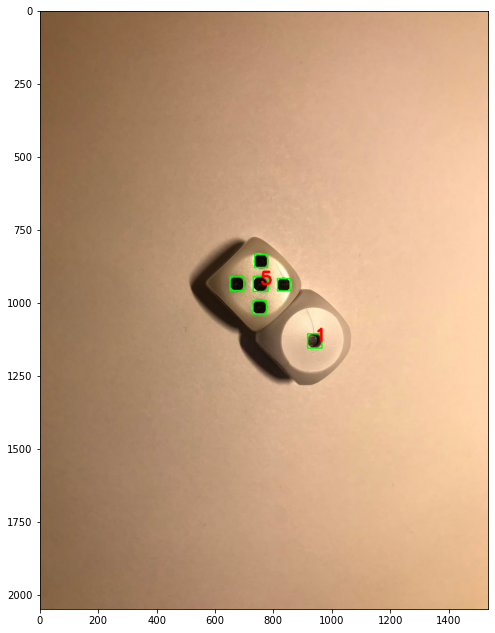

3 .
Wykryte oczka: 3
Poprawna wartość: 3


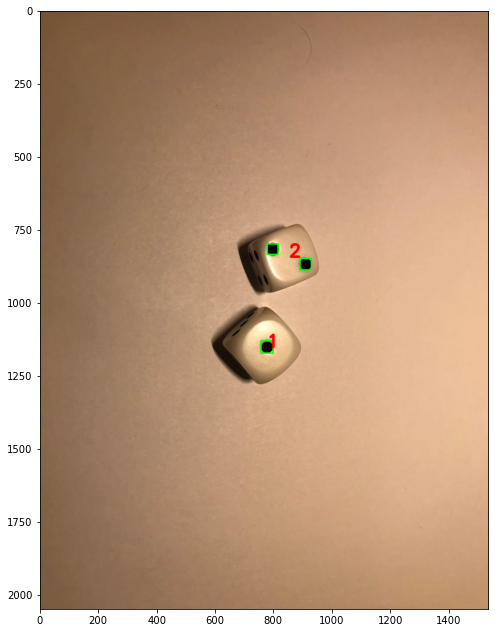

4 .
Wykryte oczka: 7
Poprawna wartość: 6


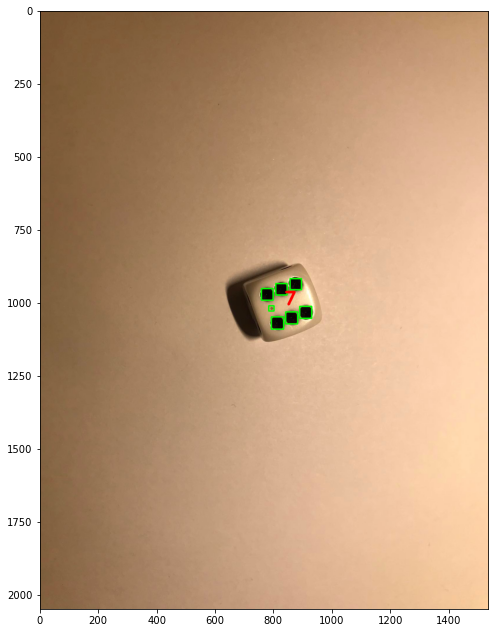

5 .
Wykryte oczka: 6
Poprawna wartość: 6


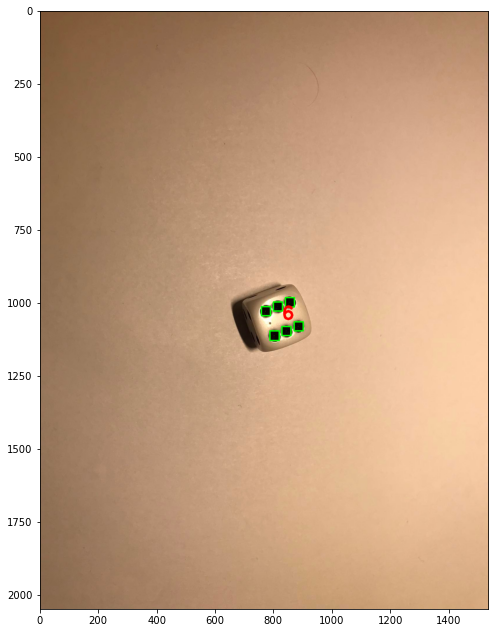

6 .
Wykryte oczka: 10
Poprawna wartość: 10


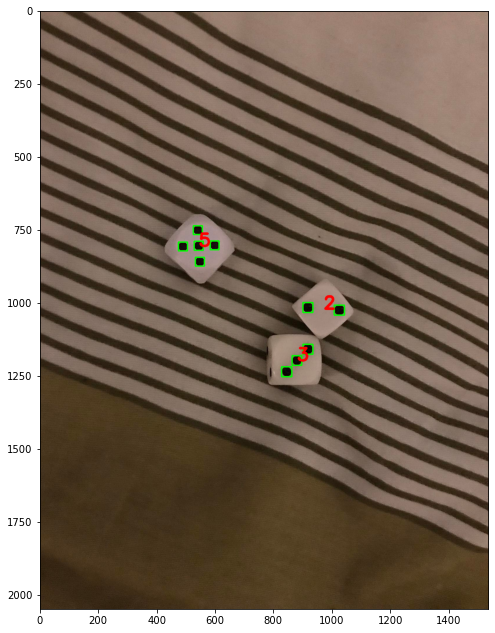

7 .
Wykryte oczka: 3
Poprawna wartość: 3


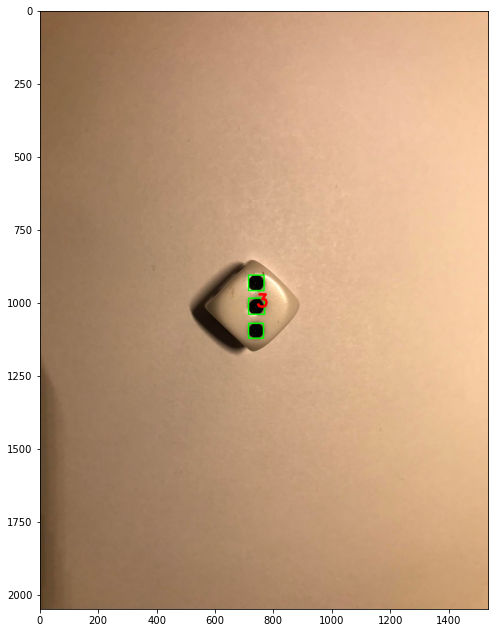

8 .
Wykryte oczka: 6
Poprawna wartość: 6


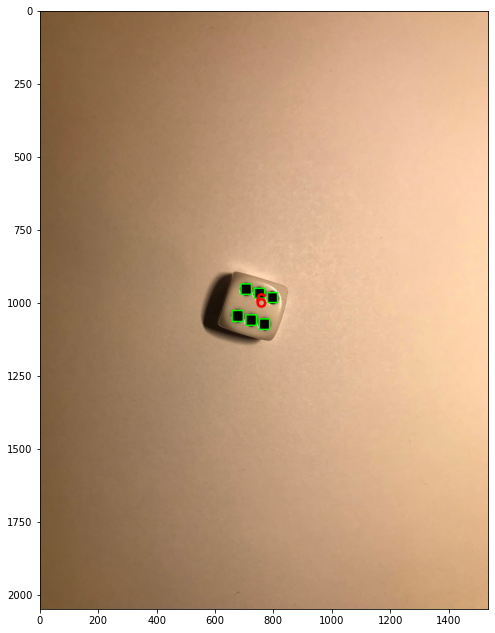

9 .
Wykryte oczka: 5
Poprawna wartość: 5


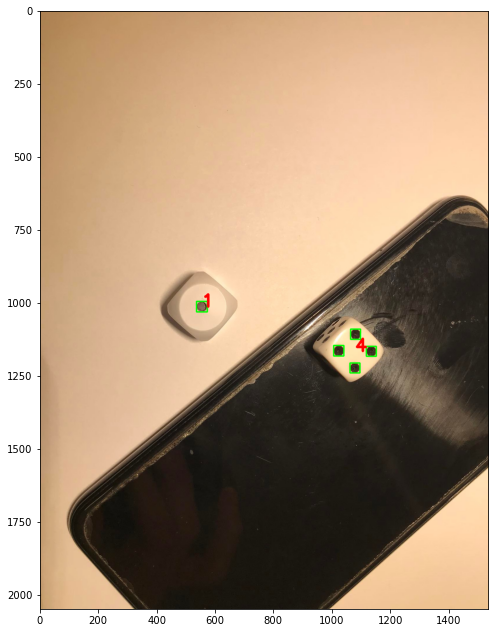

10 .
Wykryte oczka: 14
Poprawna wartość: 14


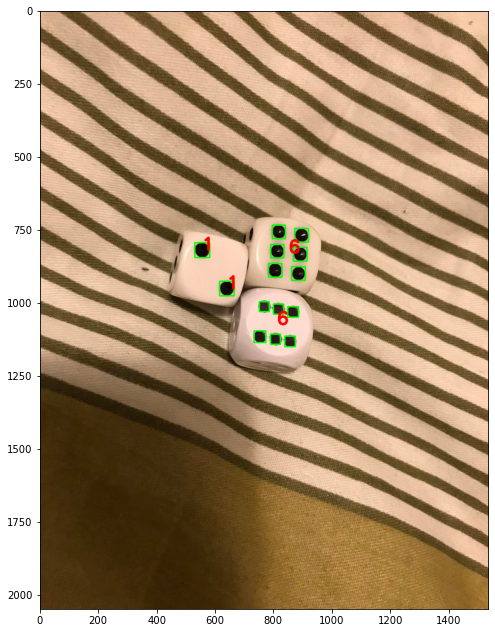

11 .
Wykryte oczka: 9
Poprawna wartość: 9


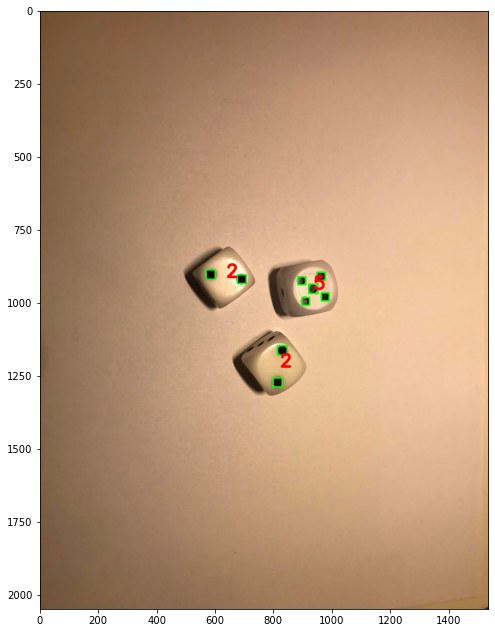

12 .
Wykryte oczka: 7
Poprawna wartość: 13


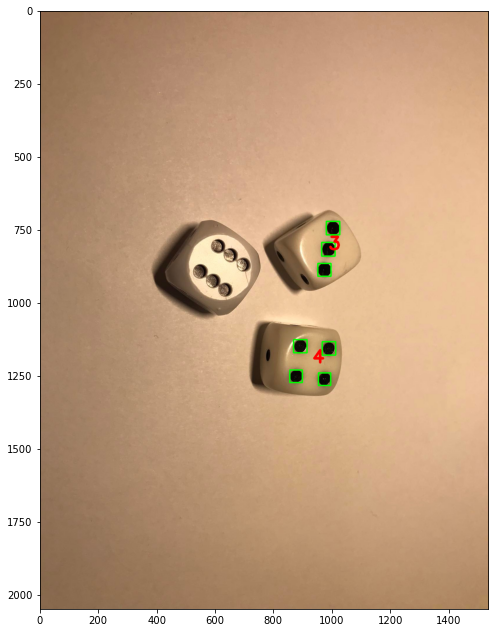

13 .
Wykryte oczka: 5
Poprawna wartość: 5


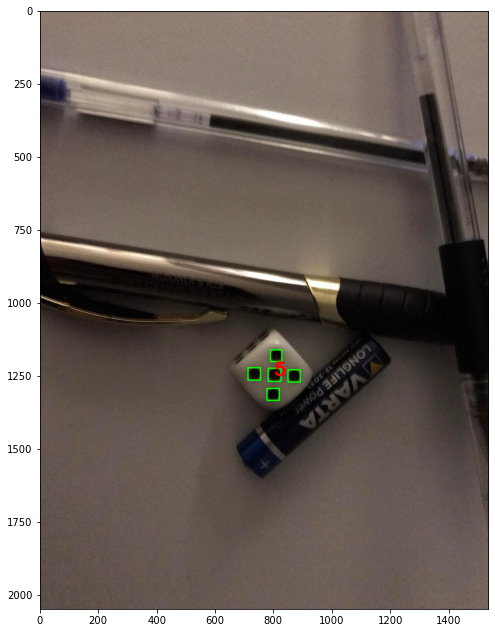

14 .
Wykryte oczka: 5
Poprawna wartość: 6


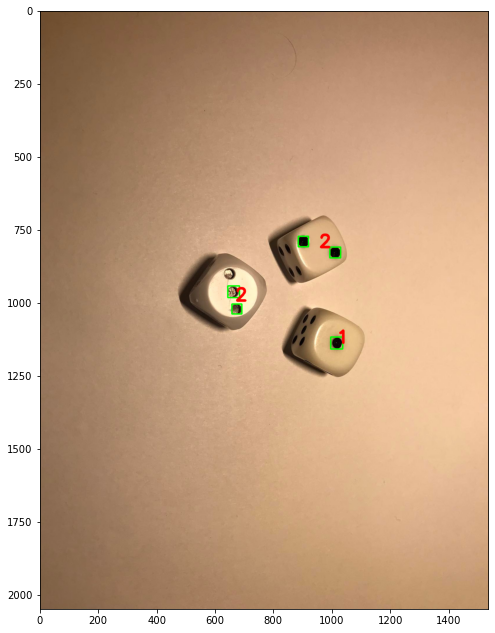

15 .
Wykryte oczka: 6
Poprawna wartość: 6


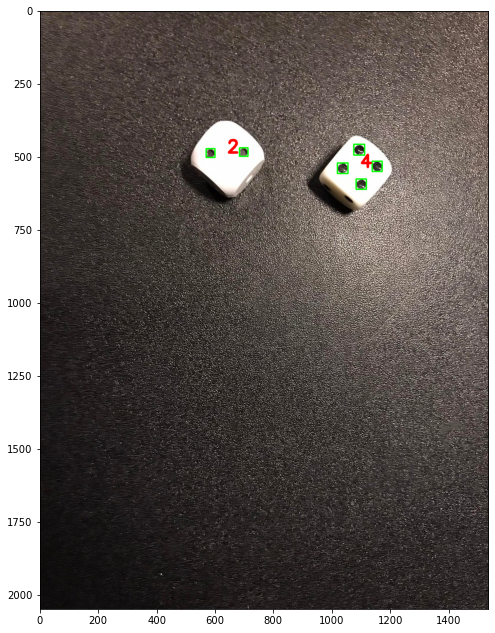

16 .
Wykryte oczka: 15
Poprawna wartość: 15


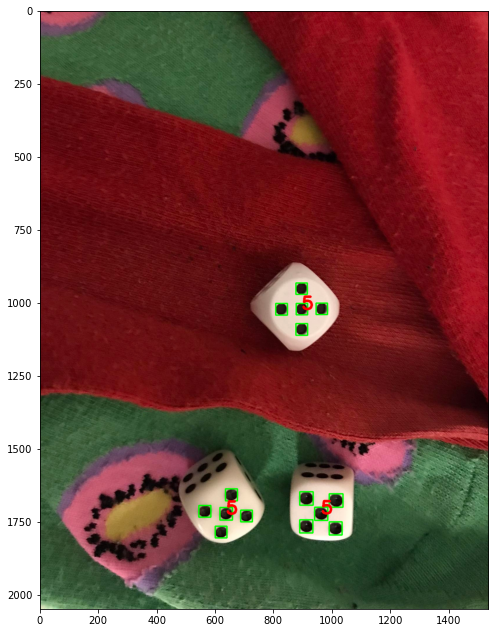

17 .
Wykryte oczka: 6
Poprawna wartość: 6


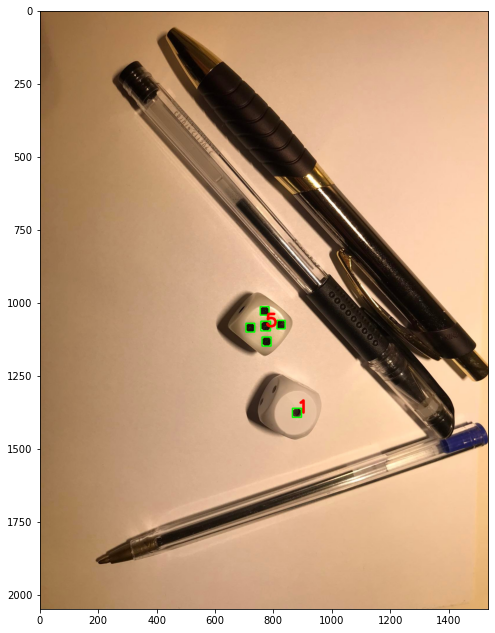

18 .
Wykryte oczka: 10
Poprawna wartość: 10


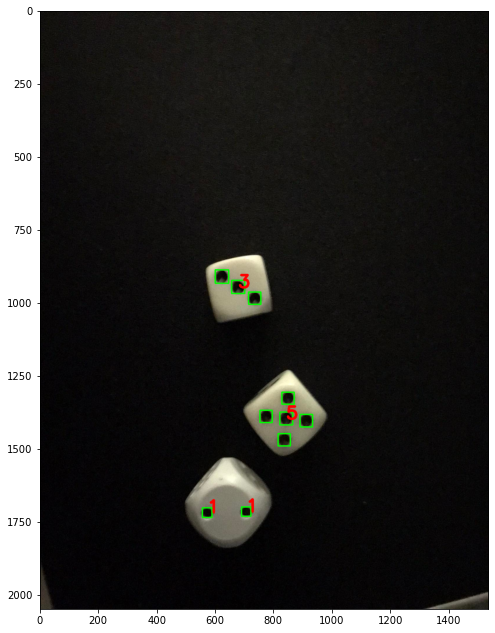

19 .
Wykryte oczka: 12
Poprawna wartość: 12


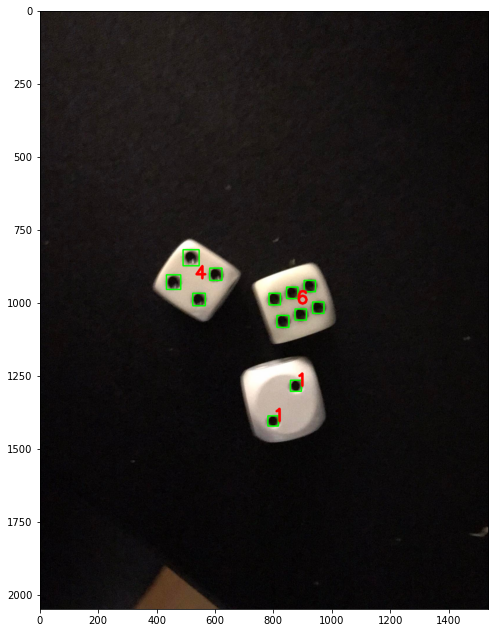

20 .
Wykryte oczka: 10
Poprawna wartość: 10


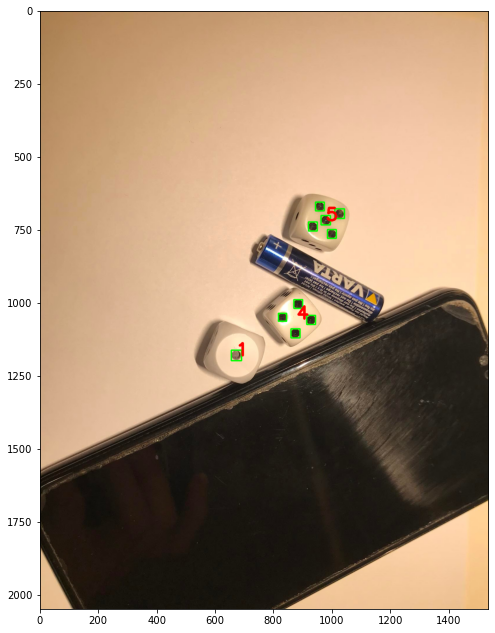

21 .
Wykryte oczka: 14
Poprawna wartość: 14


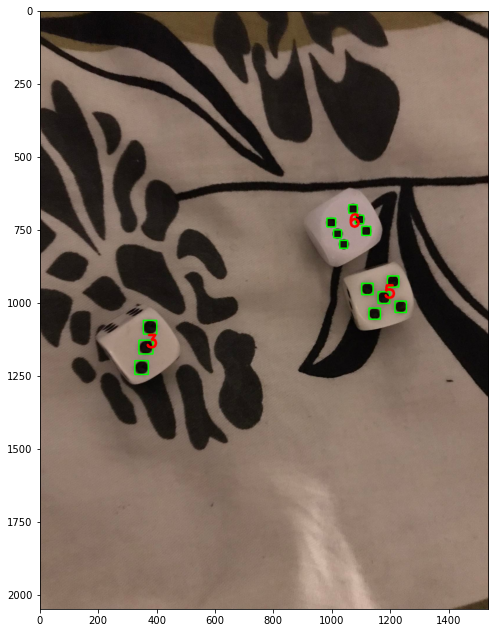

22 .
Wykryte oczka: 13
Poprawna wartość: 8


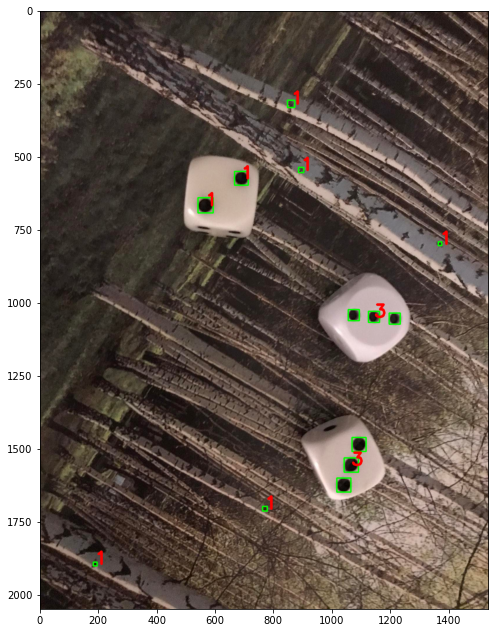

23 .
Wykryte oczka: 10
Poprawna wartość: 10


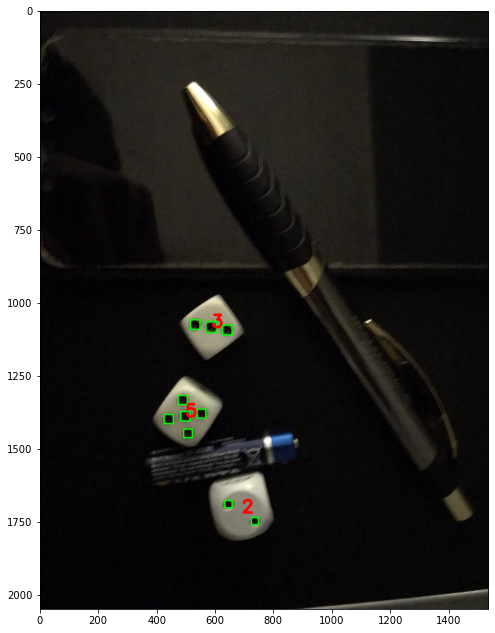

24 .
Wykryte oczka: 10
Poprawna wartość: 10


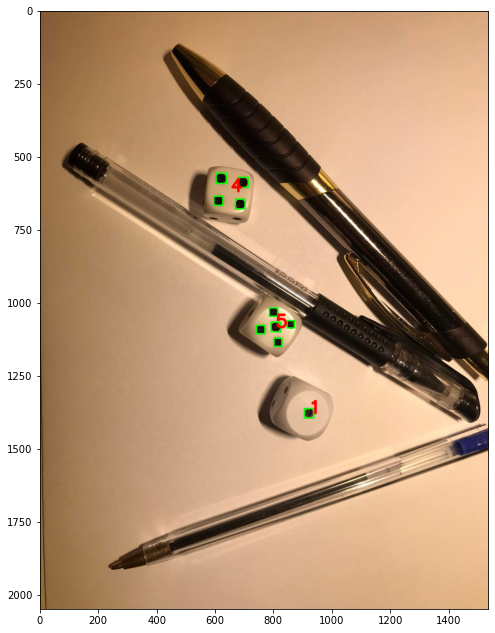

25 .
Wykryte oczka: 10
Poprawna wartość: 10


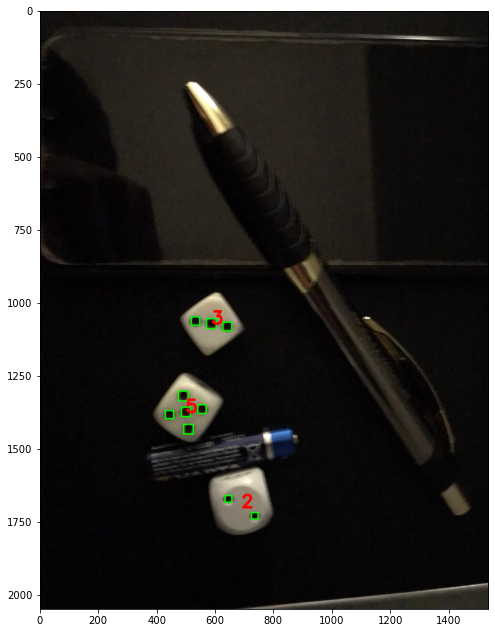

26 .
Wykryte oczka: 13
Poprawna wartość: 13


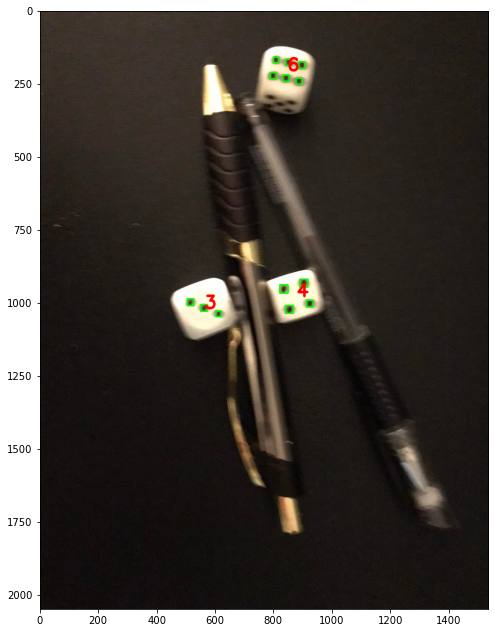

27 .
Wykryte oczka: 10
Poprawna wartość: 10


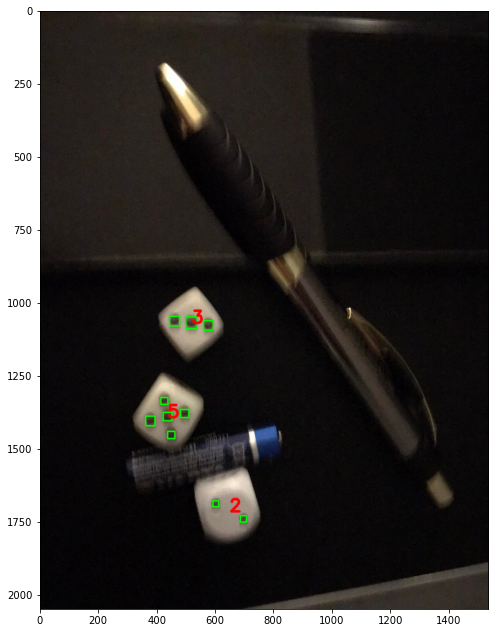

28 .
Wykryte oczka: 10
Poprawna wartość: 8


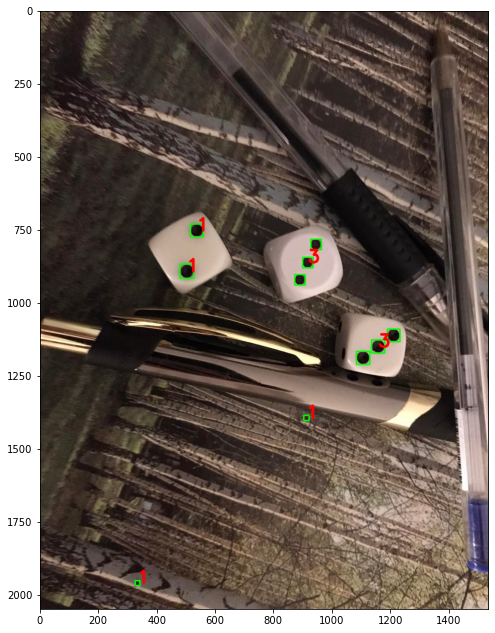

29 .
Wykryte oczka: 5
Poprawna wartość: 5


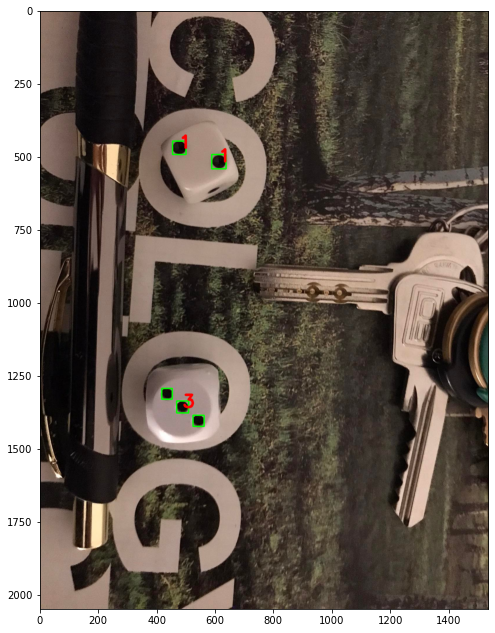

30 .
Wykryte oczka: 6
Poprawna wartość: 6


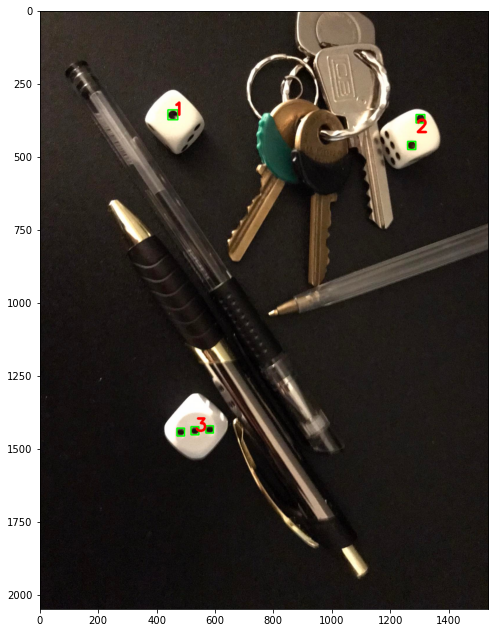

31 .
Wykryte oczka: 14
Poprawna wartość: 14


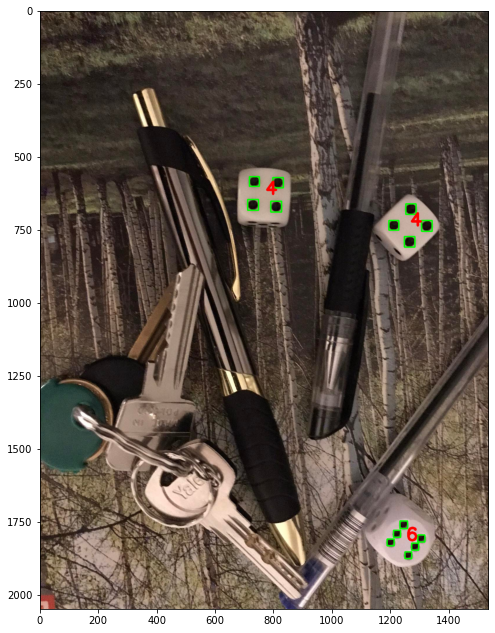

32 .
Wykryte oczka: 18
Poprawna wartość: 14


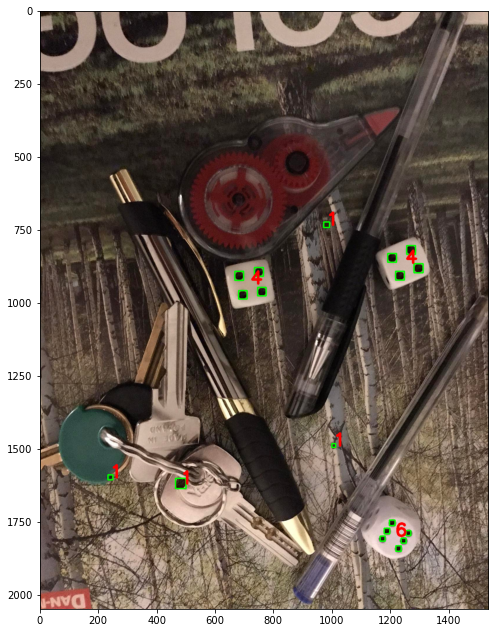

33 .
Wykryte oczka: 8
Poprawna wartość: 8


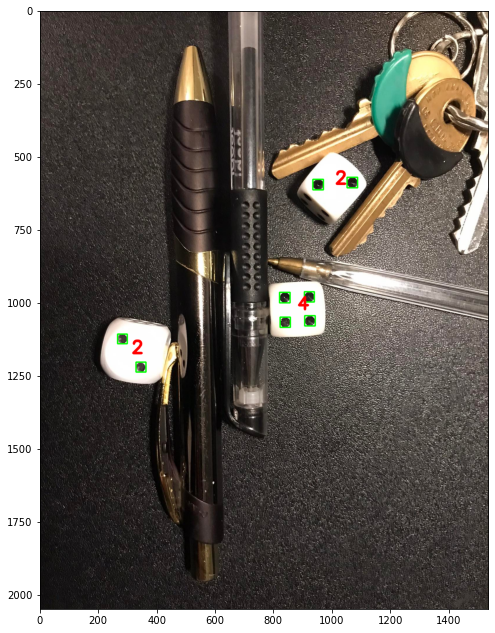

34 .
Wykryte oczka: 6
Poprawna wartość: 6


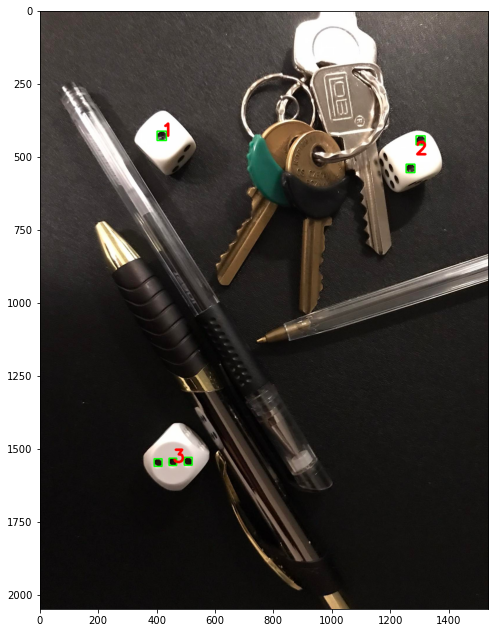

35 .
Wykryte oczka: 8
Poprawna wartość: 8


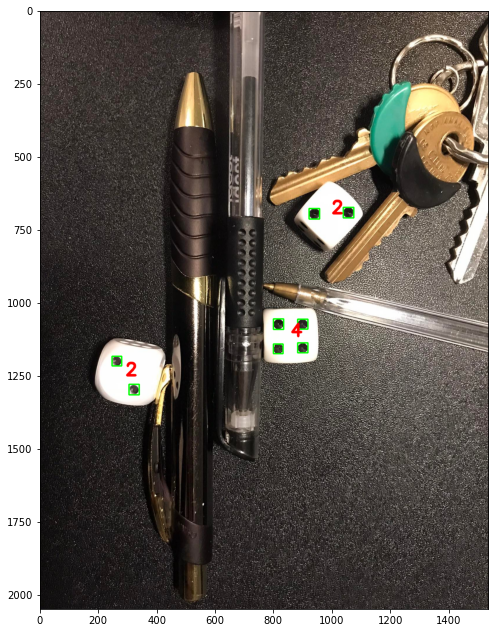

36 .
Wykryte oczka: 6
Poprawna wartość: 6


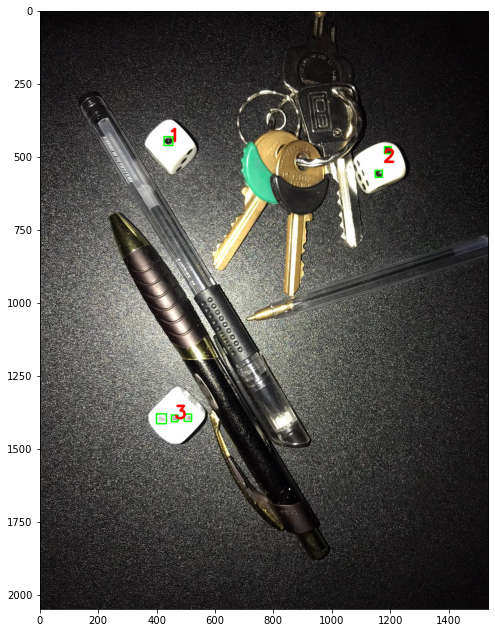

37 .
Wykryte oczka: 6
Poprawna wartość: 6


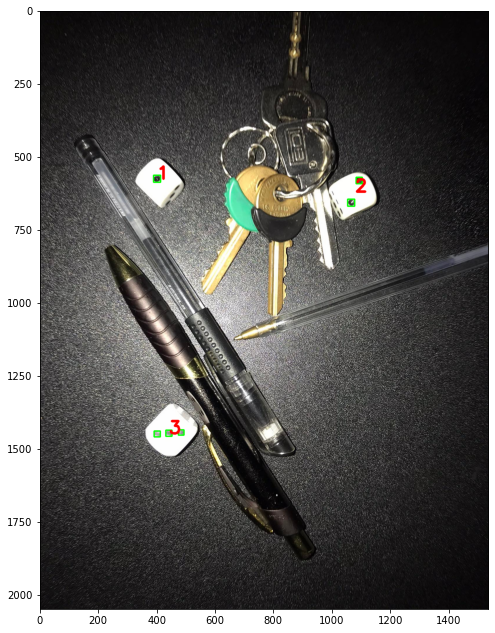

38 .
Wykryte oczka: 16
Poprawna wartość: 14


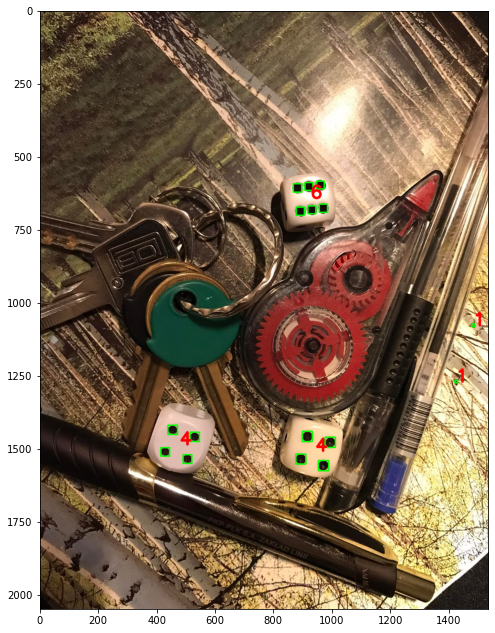

Bezbłędnie rozpoznano 81.58 % ( 31 / 38 )


In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from sklearn import cluster
from colorama import Fore, Style

params = cv2.SimpleBlobDetector_Params()

params.minThreshold = 0
params.maxThreshold = 255
params.filterByColor = True
params.blobColor = 0
params.filterByCircularity = True
params.minCircularity = 0.839
params.filterByConvexity = True
params.minConvexity = 0.97
params.filterByInertia = True
params.minInertiaRatio = 0.63

detector = cv2.SimpleBlobDetector_create(params)

numberOfImages = 38
correctCounter = 0
eyletsCorrectCounter = 0
blurValue = (16, 16)
imgs = []
properValues = [14, 6, 3, 6, 6, 10, 3, 6, 5, 14, 9, 13, 5, 6, 6, 15, 6, 10, 12,
               10, 14, 8, 10, 10, 10, 13, 10, 8, 5, 6, 14, 14, 8, 6, 8, 6, 6, 14]

def read_img(i):
    img = cv2.imread('dice\img_' + str(i) + '.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def display_img(i):
    plt.figure(figsize = (11, 11))
    plt.imshow(imgs[i])
    plt.show()

def eyelets_detection(i):  
    imgBlurred = cv2.blur(imgs[i], blurValue)
    return detector.detect(imgBlurred)

def dice_detection(eyelets):    
    blobCentroids = []
    for eye in eyelets:
        if eye.pt != None:
            blobCentroids.append(eye.pt)
            
    blobCentroids = np.asarray(blobCentroids)
    
    if len(blobCentroids) > 0:
        algorithm = cluster.DBSCAN(eps = 125, min_samples = 0).fit(blobCentroids)
        
        foundDice = max(algorithm.labels_) + 1
        dice = []
        
        for i in range(foundDice):
            diceCentroids = blobCentroids[algorithm.labels_ == i]
            centroid_dice = np.mean(diceCentroids, axis = 0)
            dice.append([len(diceCentroids), *centroid_dice])
        
        return dice
    else:
        return []
    
def draw_borders(i, dice, eyelets):
    for eyelet in eyelets:
        center = eyelet.pt
        leftUpper = tuple(int(i - (eyelet.size) / 2) for i in center)
        rightBottom = tuple(int(i + (eyelet.size) / 2) for i in center)
        cv2.rectangle(imgs[i], leftUpper, rightBottom, (0, 255, 0), 4)
        
    for d in dice:
        cv2.putText(imgs[i], str(d[0]), (int(d[1]), int(d[2])), 0, 2, (255, 0, 0), 7)


for i in range(numberOfImages):
    print(i + 1, '.')
    imgs.append(read_img(i + 1))
    eyelets = eyelets_detection(i)
    if len(eyelets) == properValues[i]:
        print('Wykryte oczka:', len(eyelets))
        print('Poprawna wartość:', properValues[i])
        correctCounter += 1
    else:
        print(Fore.RED + Style.BRIGHT + 'Wykryte oczka:', len(eyelets))
        print(Fore.RED + Style.BRIGHT + 'Poprawna wartość:', properValues[i])
    
    dice = dice_detection(eyelets)
    draw_borders(i, dice, eyelets)
    display_img(i) 

print("Bezbłędnie rozpoznano", round(correctCounter / numberOfImages * 100, 2), "% (", correctCounter, "/", numberOfImages, ")")